In [2]:
import os
import math
from PIL import Image
import matplotlib.pyplot as plt

In [5]:
# 1. Point this at your CAMs folder:
base_dir = '/Users/rushil/Downloads/CAMs'

# 2. Get a sorted list of class-folders:
classes = sorted(
    d for d in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, d))
)
max_images = 100

print(f'Found {len(classes)} classes: {classes}')

Found 7 classes: ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


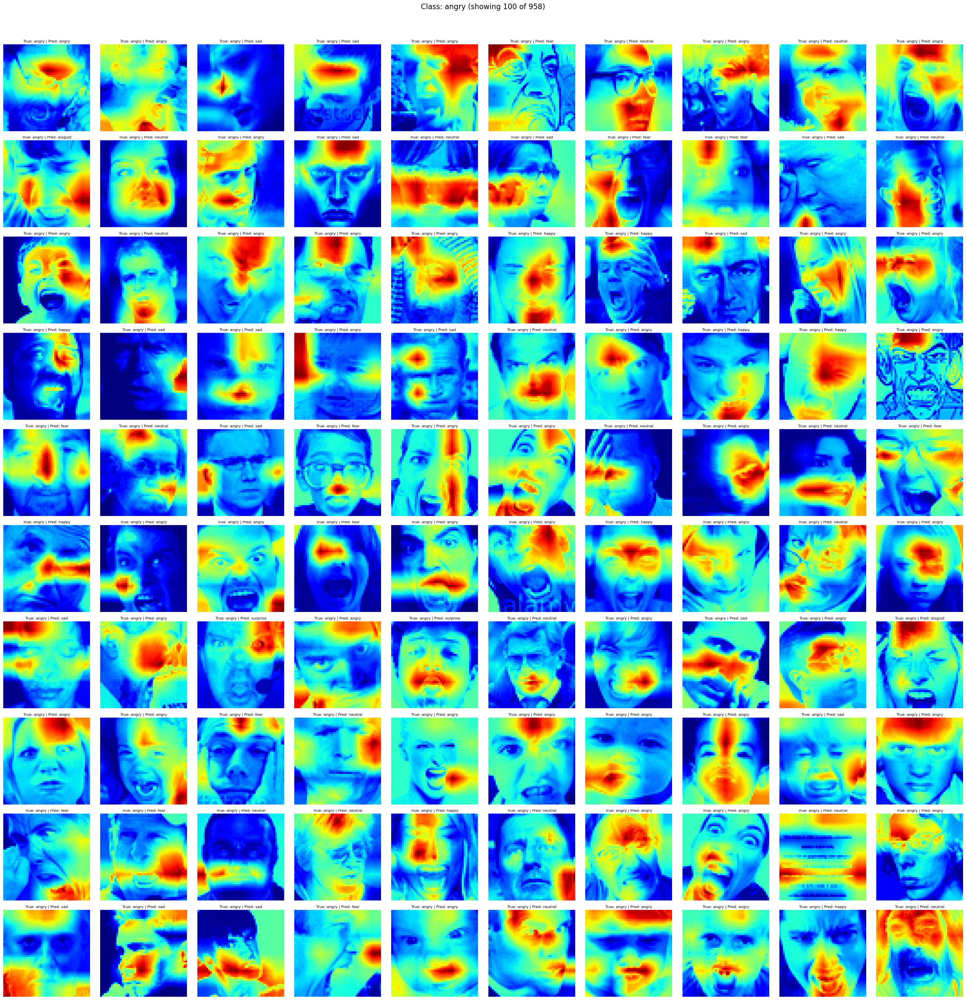

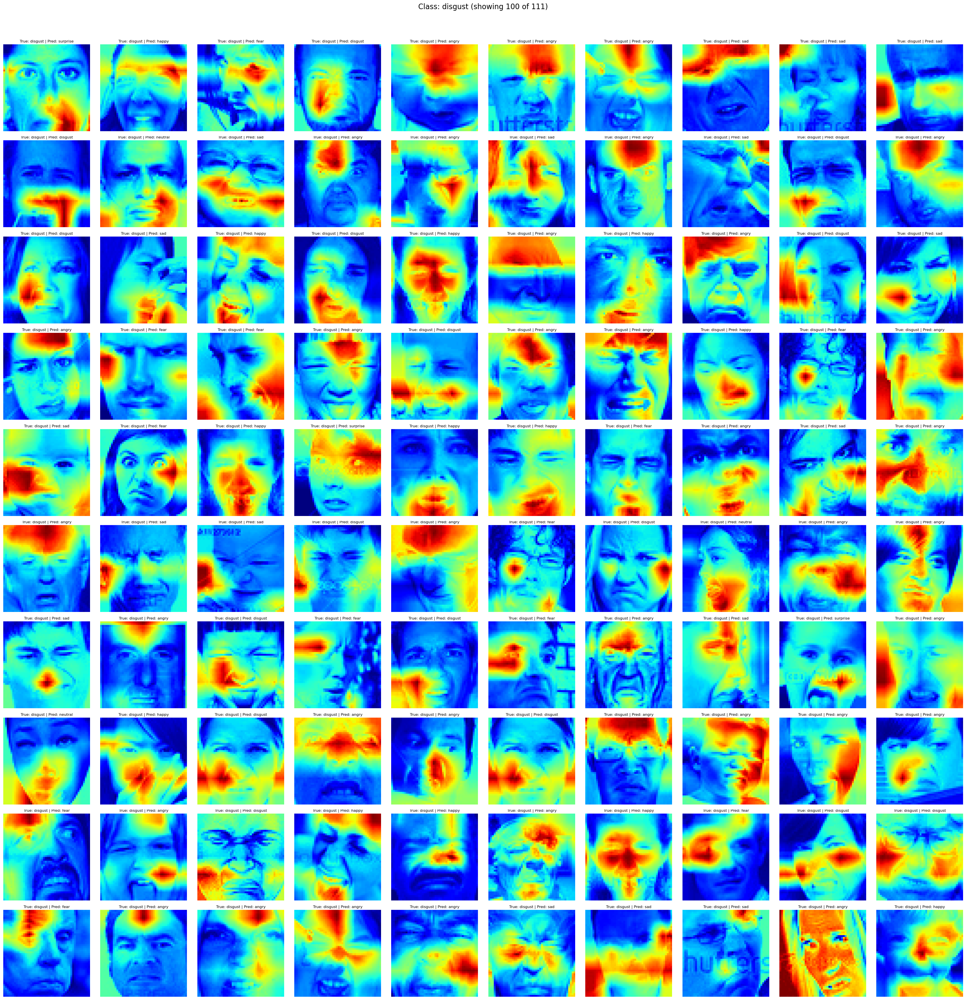

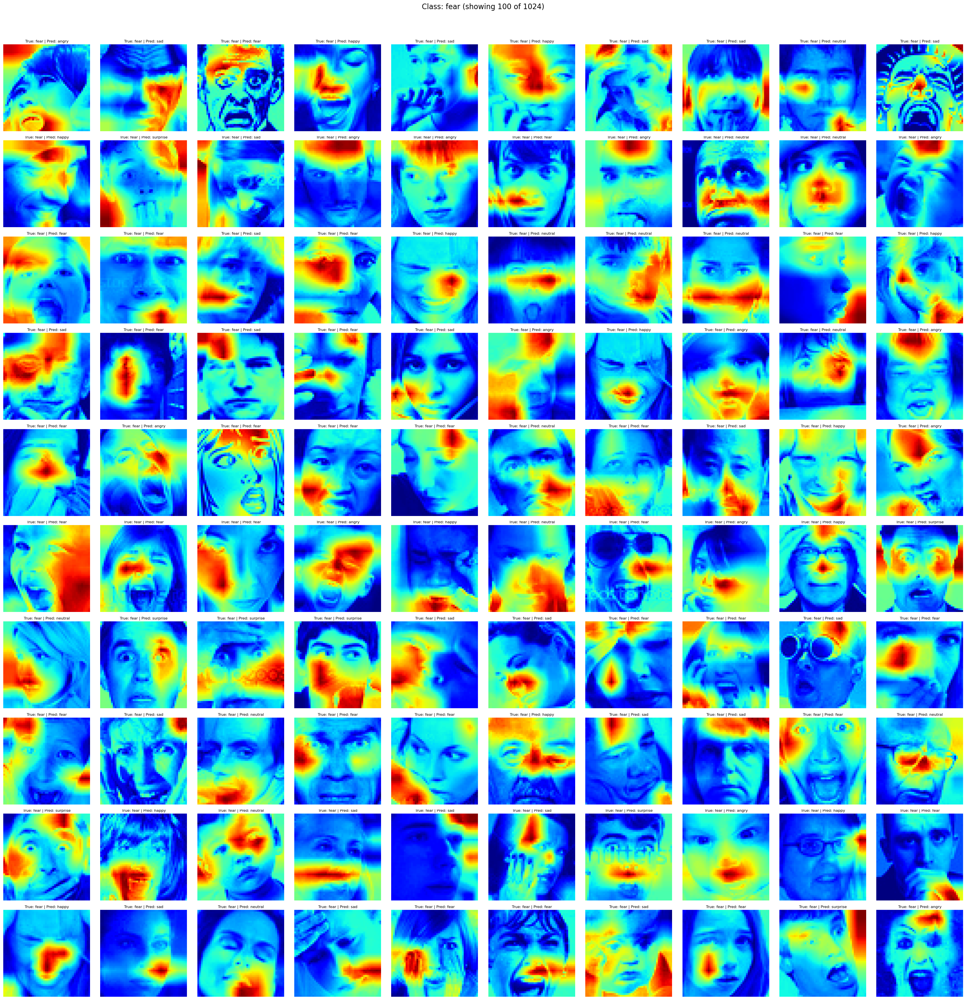

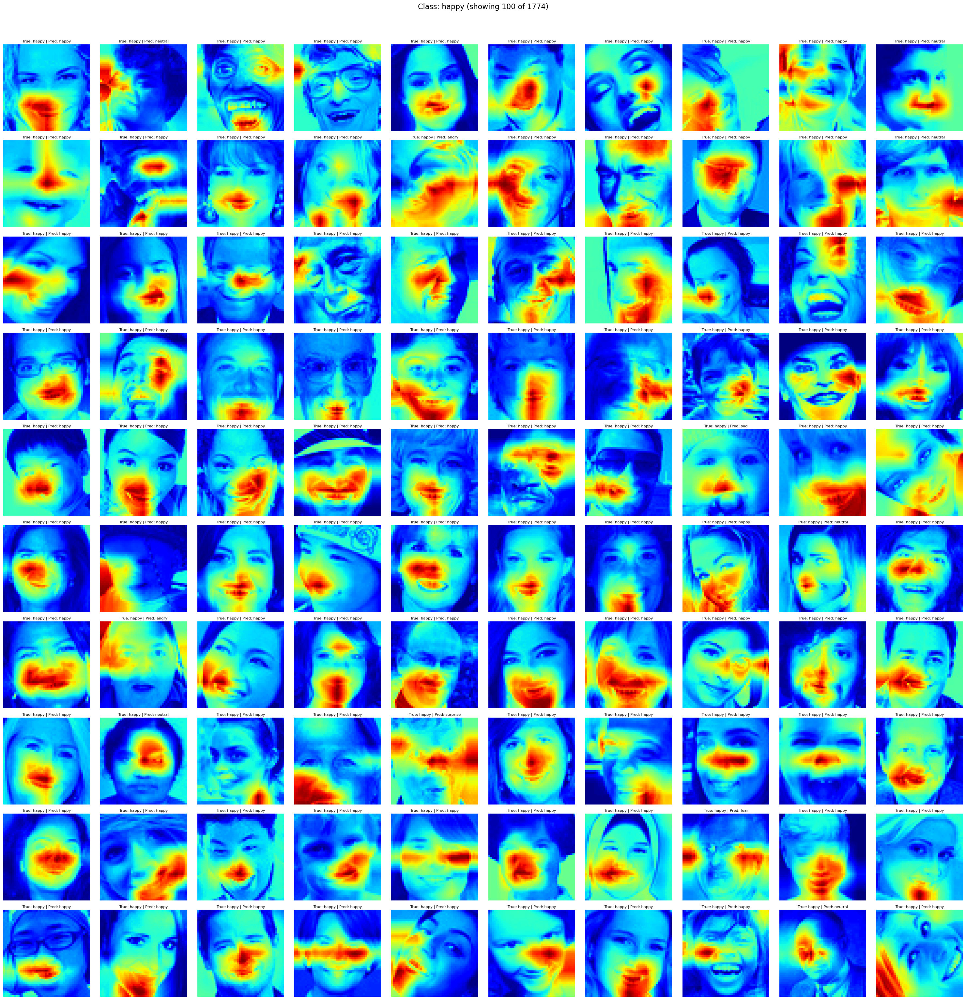

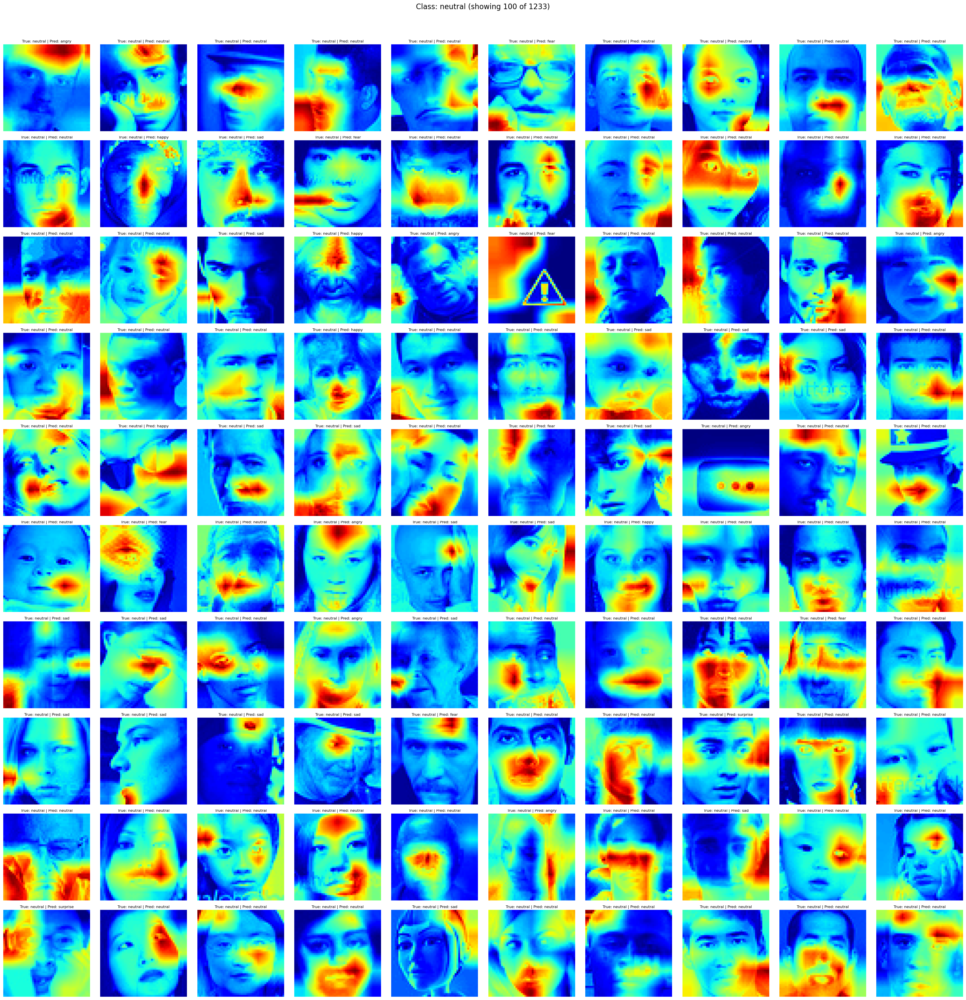

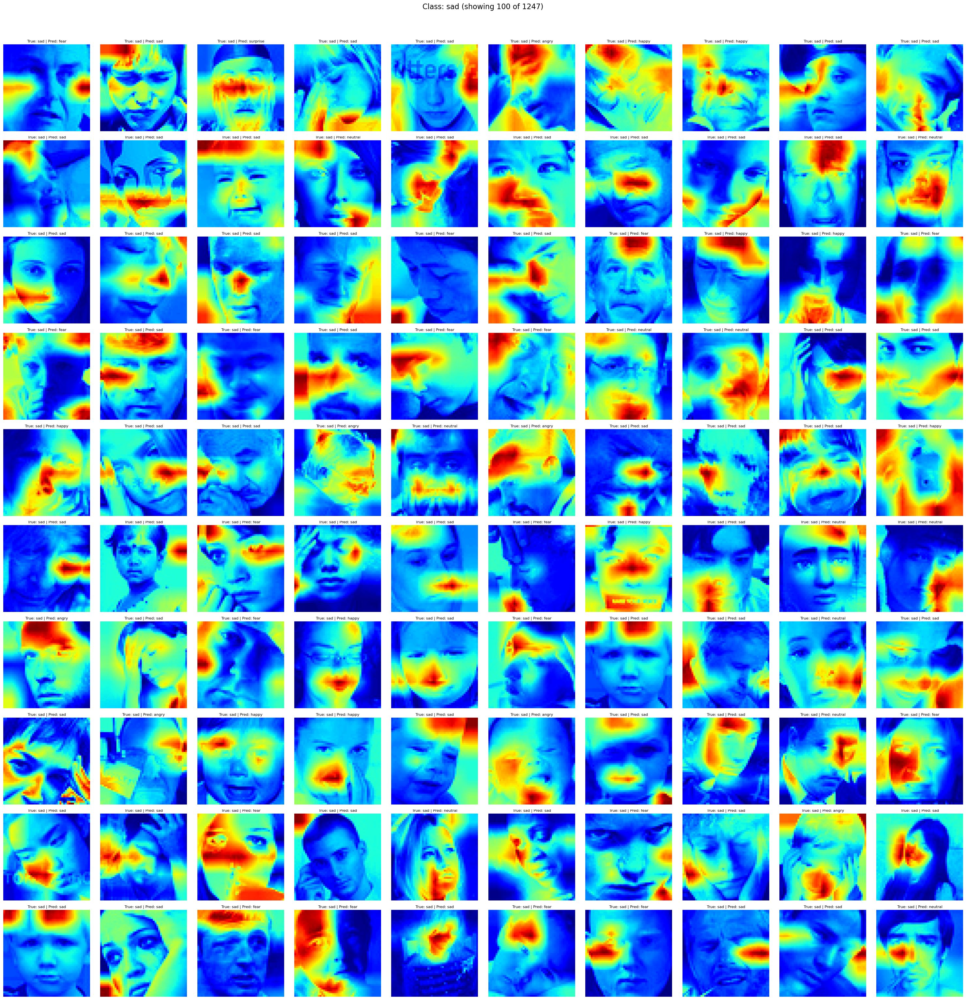

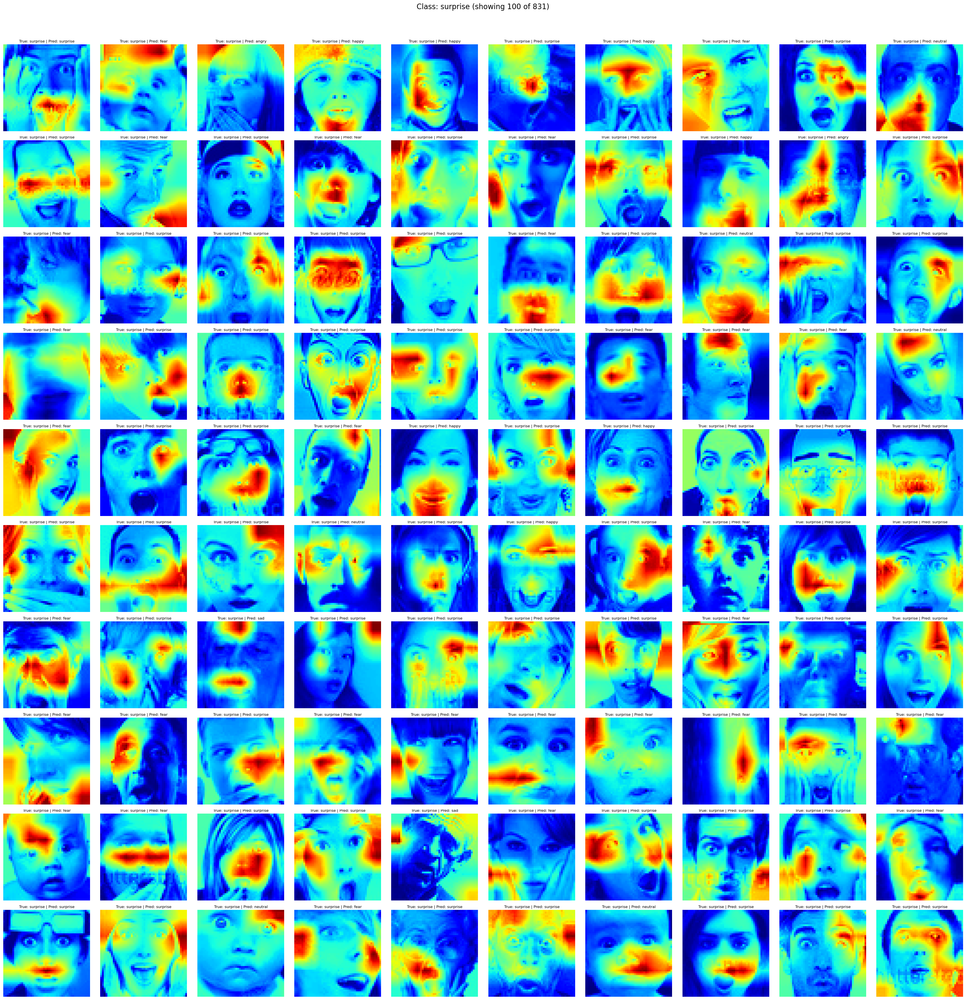

In [6]:
# 2. Loop over each class folder
for cls in sorted(os.listdir(base_dir)):
    class_dir = os.path.join(base_dir, cls)
    if not os.path.isdir(class_dir):
        continue

    # 3. Gather and limit to first 100 PNGs
    all_files = sorted(f for f in os.listdir(class_dir)
                       if f.lower().endswith('.png'))
    img_files = all_files[:max_images]
    n = len(img_files)
    if n == 0:
        continue

    # 4. Compute a nearly-square grid
    n_cols = int(math.ceil(math.sqrt(n)))
    n_rows = int(math.ceil(n / n_cols))

    # 5. Create the figure
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(n_cols*3, n_rows*3),
                             squeeze=False)
    axes = axes.flatten()

    # 6. Plot each CAM (up to 100)
    for ax, fname in zip(axes, img_files):
        img = Image.open(os.path.join(class_dir, fname))
        ax.imshow(img)
        ax.axis('off')

    # 7. Turn off any empty slots
    for ax in axes[n:]:
        ax.axis('off')

    # 8. Title and show
    fig.suptitle(f'Class: {cls} (showing {n} of {len(all_files)})',
                 fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

In [7]:
# 4. Build a grid: one row per class, one column per image slot
n_rows = len(classes)
n_cols = max_per_class
fig, axes = plt.subplots(
    n_rows, n_cols, 
    figsize=(n_cols*2, n_rows*2),
    squeeze=False  # always 2d array of axes
)

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x1076319d0>>
Traceback (most recent call last):
  File "/Users/rushil/miniconda3/envs/bline/lib/python3.8/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


In [ ]:
# 5. Fill the grid
for i, cls in enumerate(classes):
    imgs = class_to_imgs[cls]
    for j in range(n_cols):
        ax = axes[i, j]
        if j < len(imgs):
            img_path = os.path.join(base_dir, cls, imgs[j])
            ax.imshow(Image.open(img_path))
        ax.axis('off')
    # label the class on the left of each row:
    axes[i, 0].set_ylabel(cls, rotation=0, size='large', labelpad=40, va='center')

plt.tight_layout()
plt.show()
